In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14906, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 14906 (delta 11), reused 13 (delta 2), pack-reused 14880
Receiving objects: 100% (14906/14906), 13.87 MiB | 15.70 MiB/s, done.
Resolving deltas: 100% (10256/10256), done.
/content/yolov5
     |████████████████████████████████| 184 kB 37.0 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
     |████████████████████████████████| 1.6 MB 38.9 MB/s 
     |████████████████████████████████| 42 kB 806 kB/s 
     |████████████████████████████████| 145 kB 62.1 MB/s 
     |████████████████████████████████| 178 kB 72.9 MB/s 
     |████████████████████████████████| 67 kB 6.5 MB/s 
     |████████████████████████████████| 54 kB 3.0 MB/s 
     |████████████████████████████████| 138 kB 71.9 MB/s 
     |████████████████████████████████| 62 kB 715 kB/s 
Setup complete. Using torch 1.13.0+cu116 (Tesla T4)


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="EOw7tbRrWu8mY9SiLZZg")
project = rf.workspace("capstone-4l4ul").project("okra-detection")
dataset = project.version(1).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/okra-detection-1 in yolov5pytorch:: 100%|██████████| 1374/1374 [00:00<00:00, 2192.44it/s]


In [ ]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/okra-detection-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv

# Evaluate Custom YOLOv5 Detector Performance

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#okra detection in video
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source /content/drive/MyDrive/CAPSTONE/okra-vid.mp4

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/CAPSTONE/okra-vid.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/935) /content/drive/MyDrive/CAPSTONE/okra-vid.mp4: 384x640 1 okra, 12.9ms
video 1/1 (2/935) /content/drive/MyDrive/CAPSTONE/okra-vid.mp4: 384x640 (no detections), 9.4ms
video 1/1 (3/935) /content/drive/MyDrive/CAPSTONE/okra-vid.mp4: 384x640 (no detections), 8.6ms
video 1/1 (4/935) /content/drive/MyDrive/CAPS

In [ ]:
!zip -r /content/results.zip /content/yolov5/runs/detect/exp3

  adding: content/yolov5/runs/detect/exp3/ (stored 0%)
  adding: content/yolov5/runs/detect/exp3/okra-vid.mp4 (deflated 9%)


In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/okra-detection-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/69 /content/datasets/okra-detection-1/test/images/okra_118_JPG.rf.549b21ec8ebb00dc9cddd964235c82fb.jpg: 416x416 6 okras, 8.1ms
image 2/69 /content/datasets/okra-detection-1/test/images/okra_138_JPG.rf.adf9322abc05f0b0fe5322cc5732d95d.jpg: 416x416 2 okras, 8.1ms
image 3/69 /content/datasets/okra-detection-1/test/

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.25 --source /content/drive/MyDrive/CAPSTONE/samples

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/CAPSTONE/samples, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/26 /content/drive/MyDrive/CAPSTONE/samples/10_original.jpeg: 416x192 (no detections), 10.9ms
image 2/26 /content/drive/MyDrive/CAPSTONE/samples/11_original.jpeg: 416x192 (no detections), 9.1ms
image 3/26 /content/drive/MyDrive/CAPSTONE/samples/12_original.jpeg: 416x192 1 okra, 8.4ms
image 4/26 /content/drive/MyDrive/C

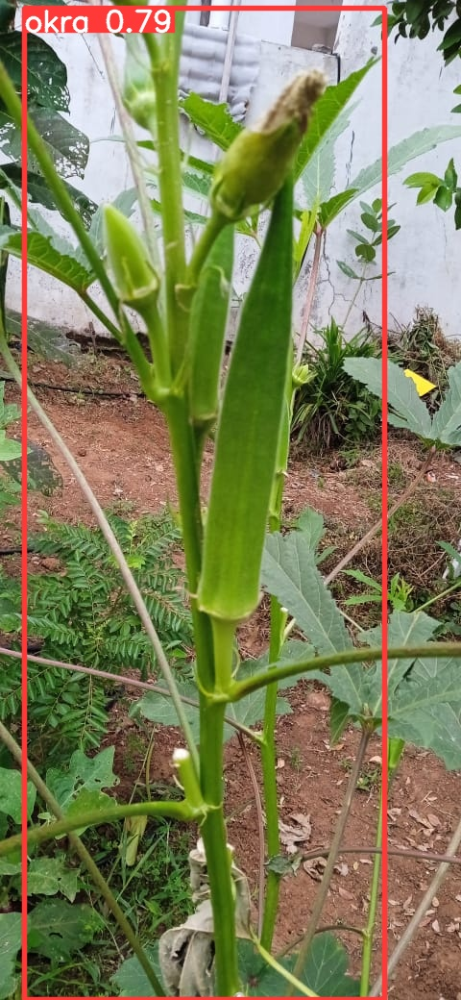

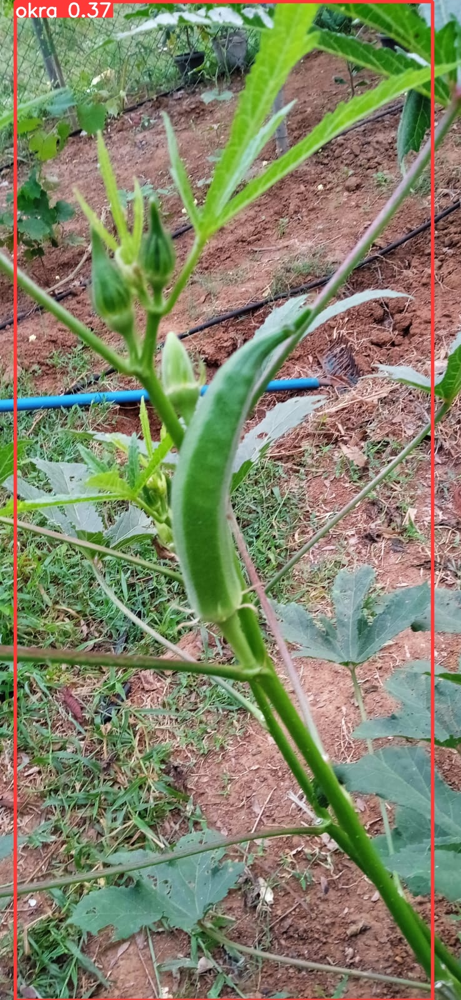

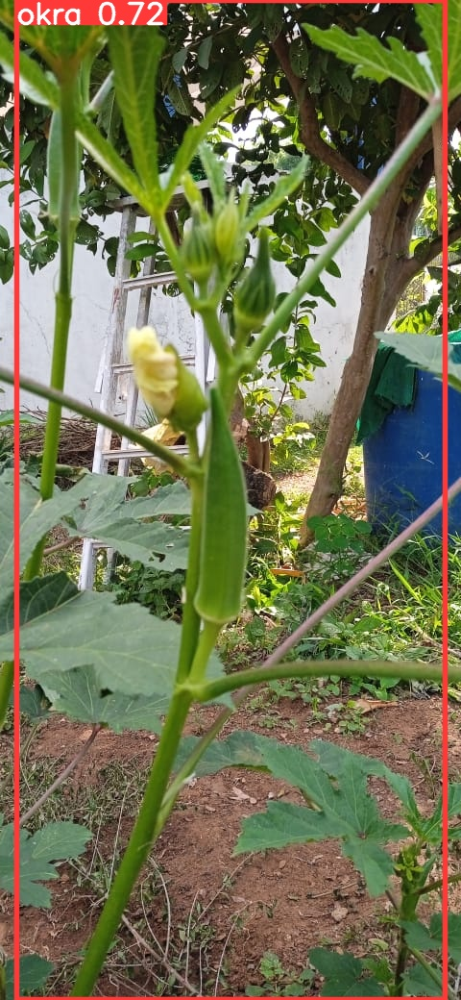

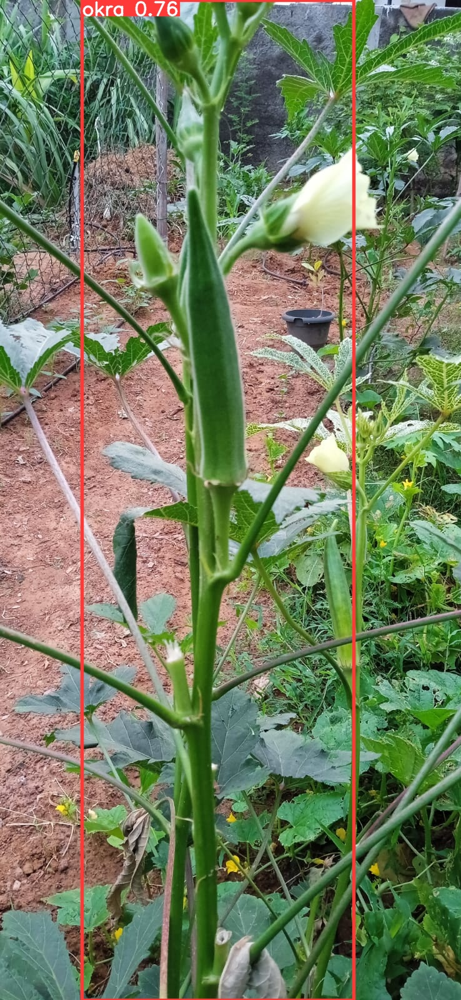

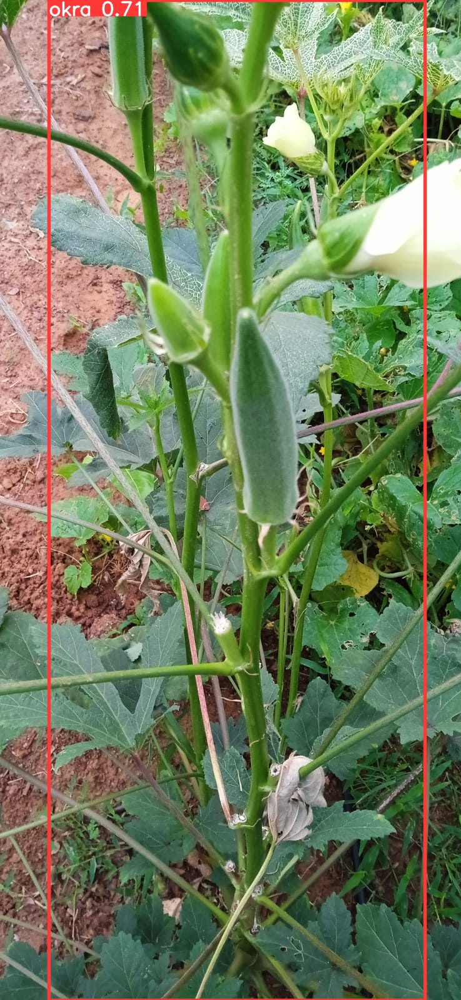

...

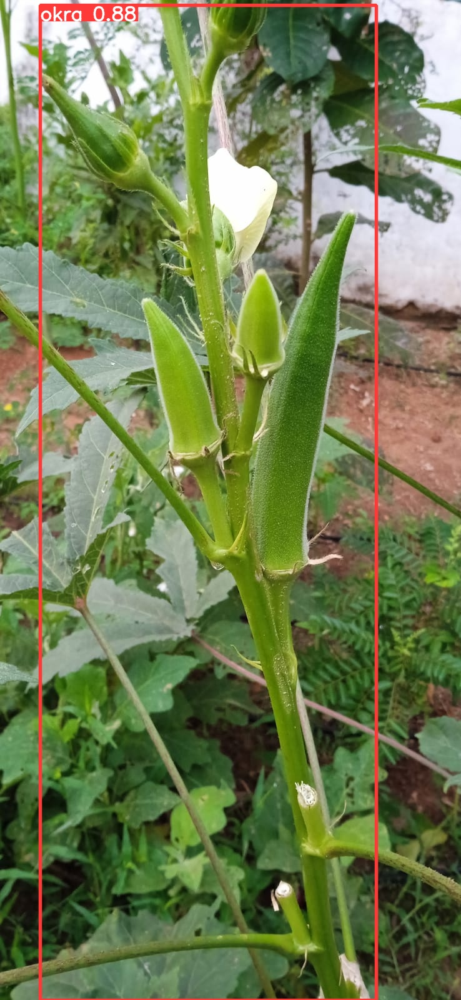

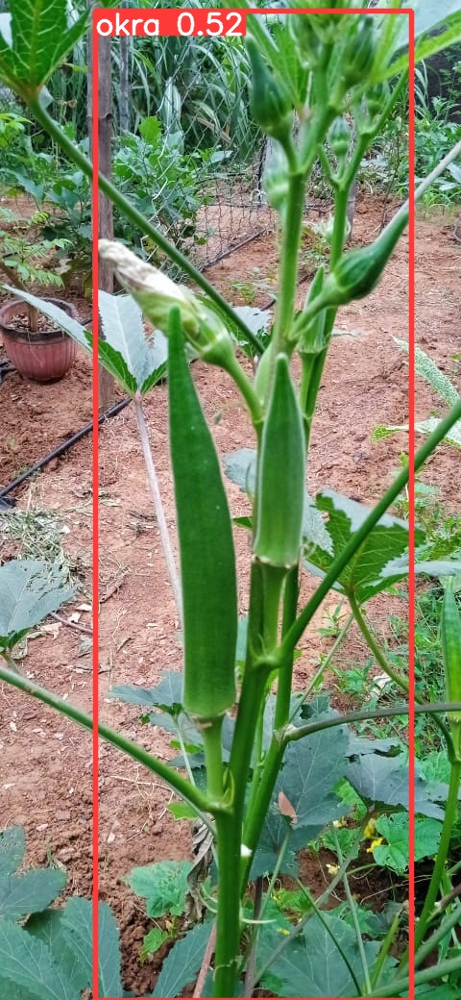

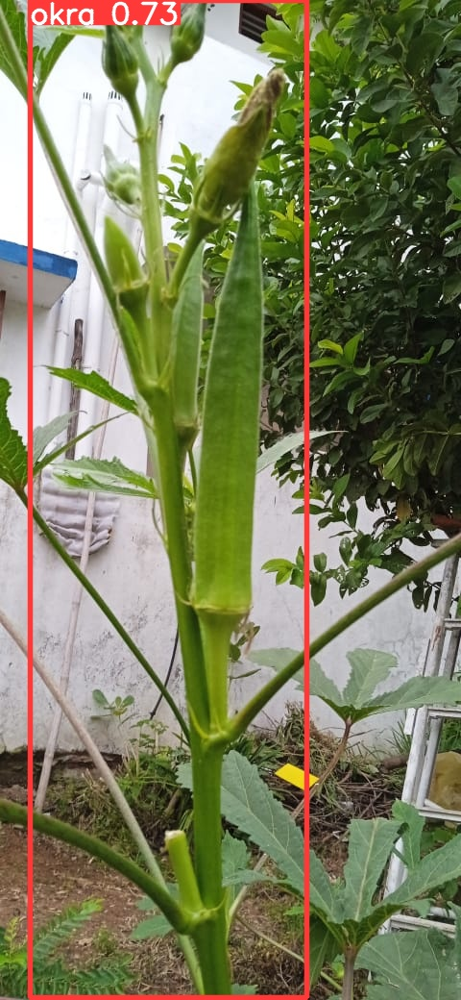

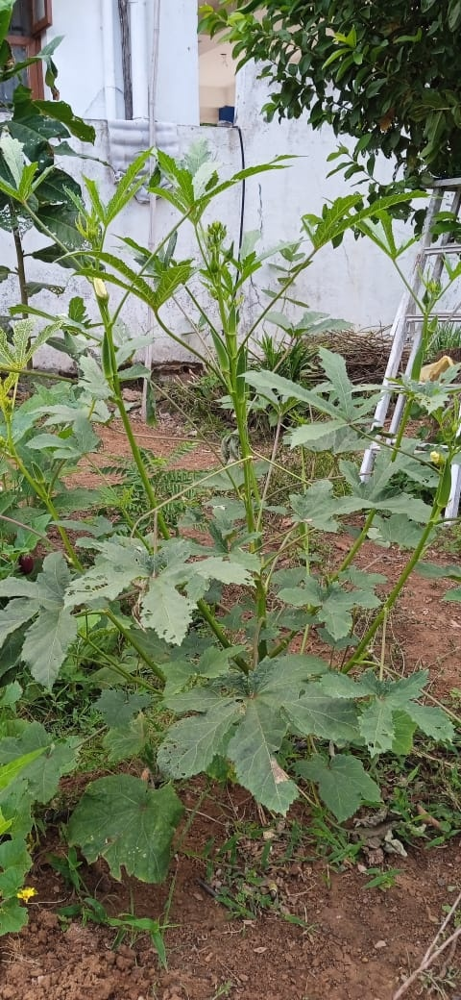

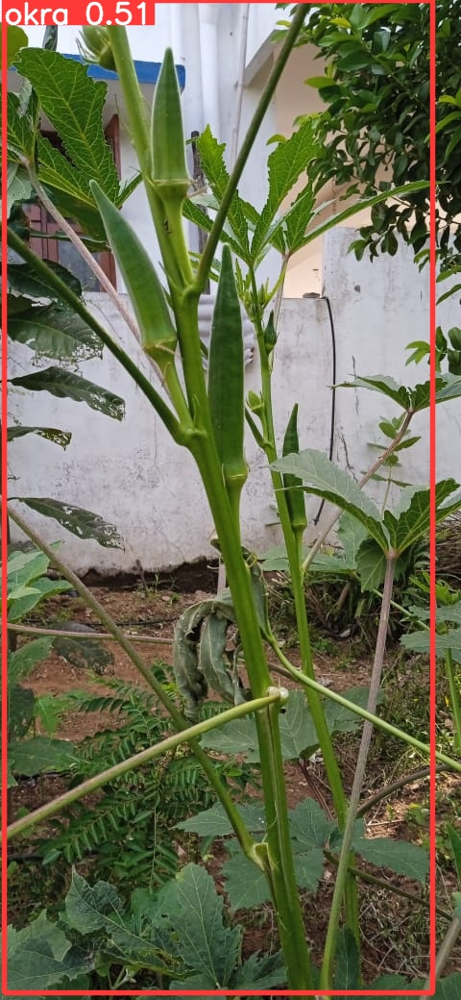

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpeg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

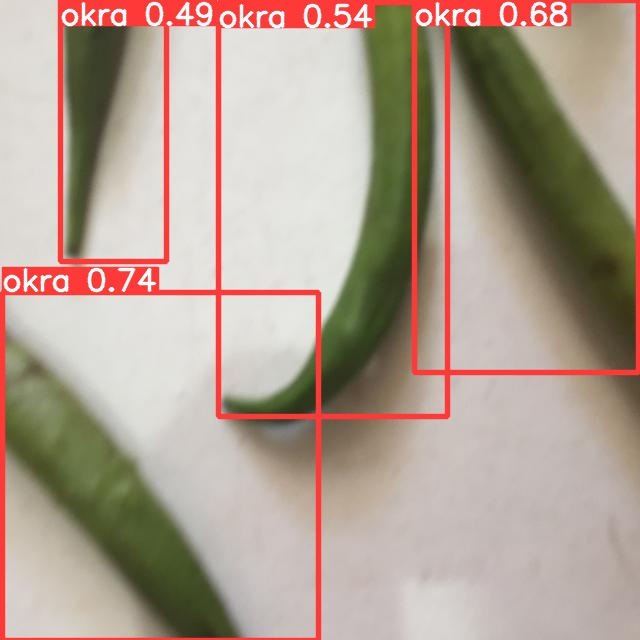

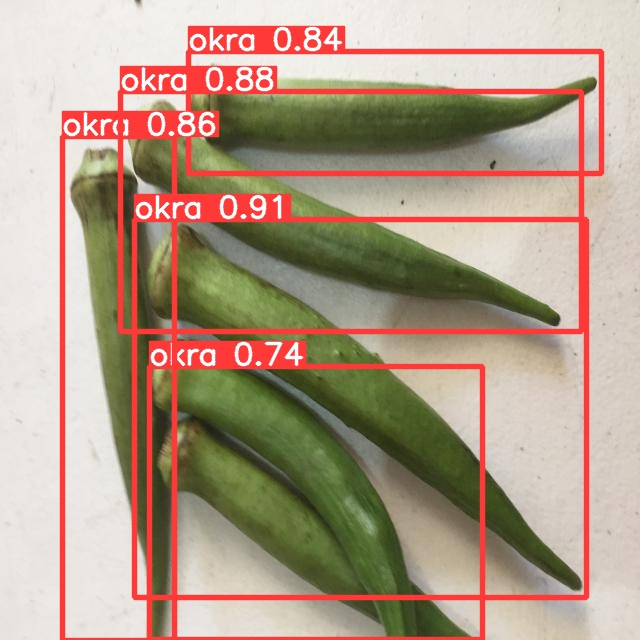

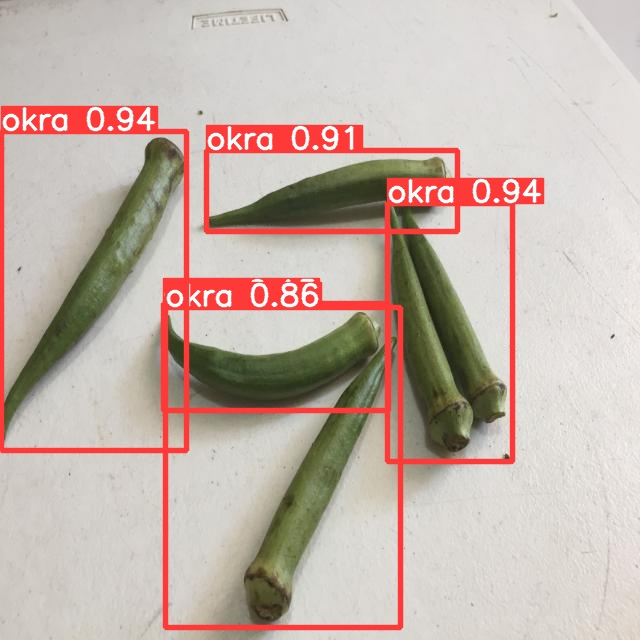

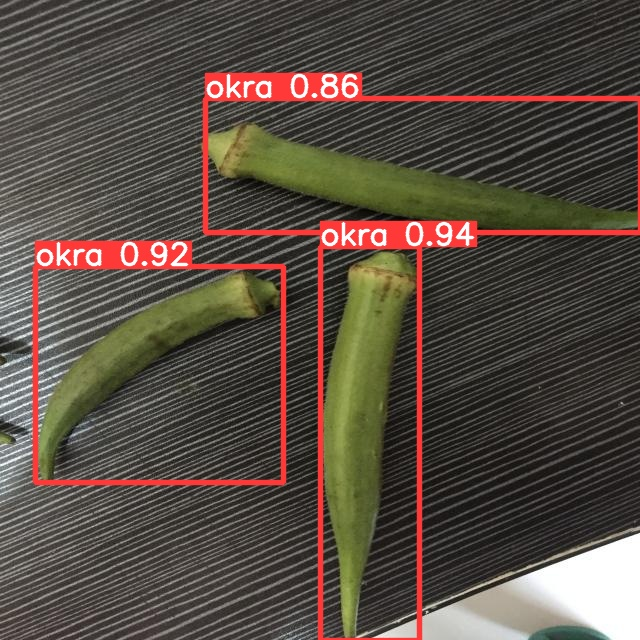

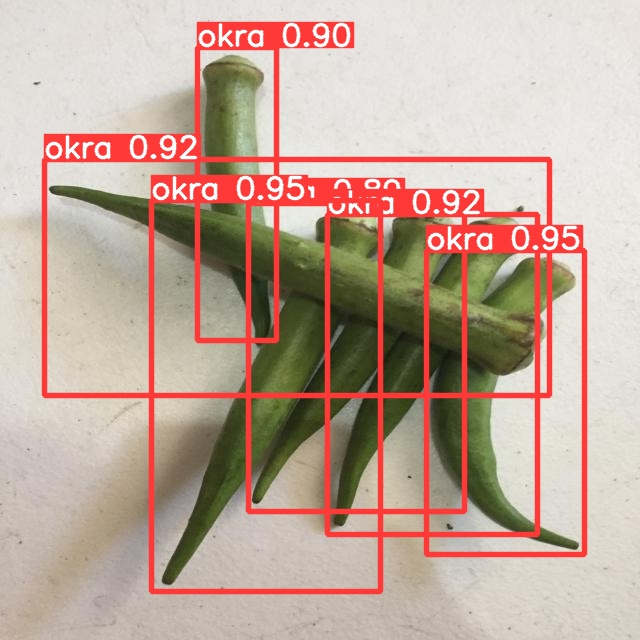

...

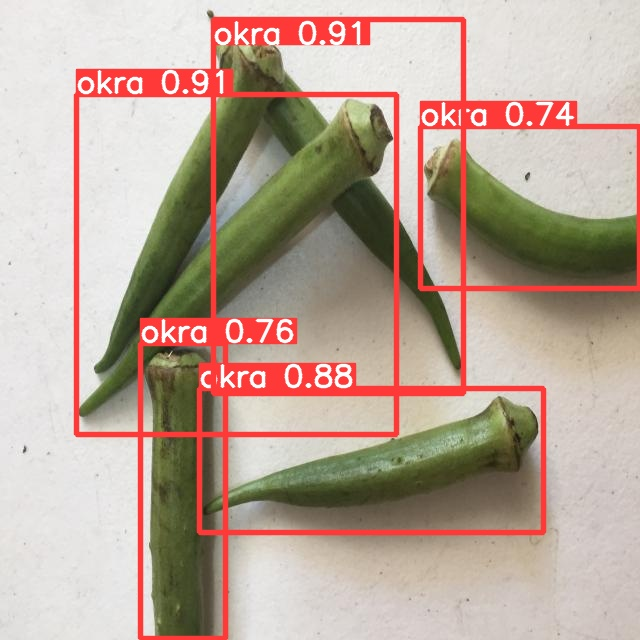

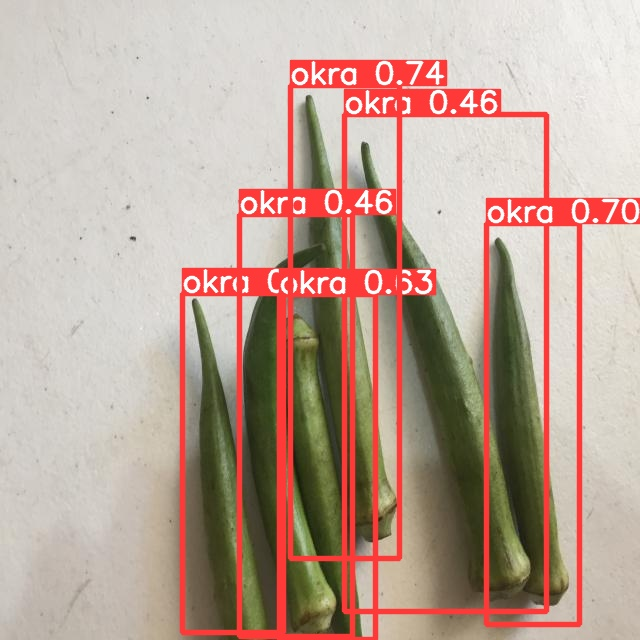

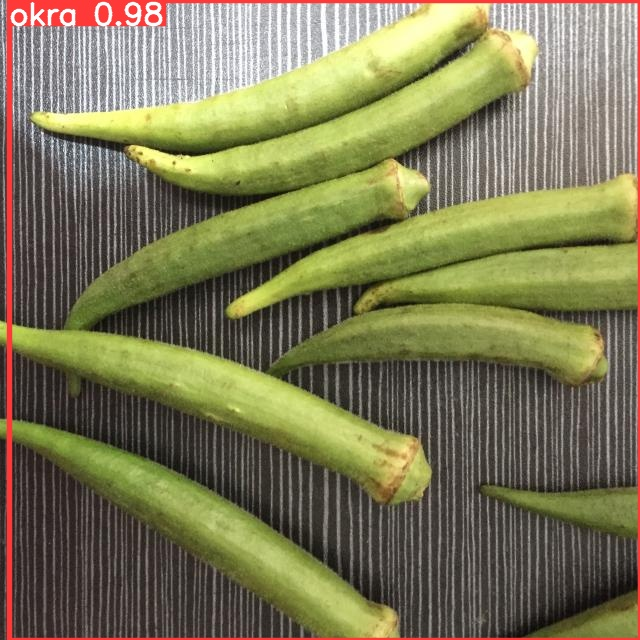

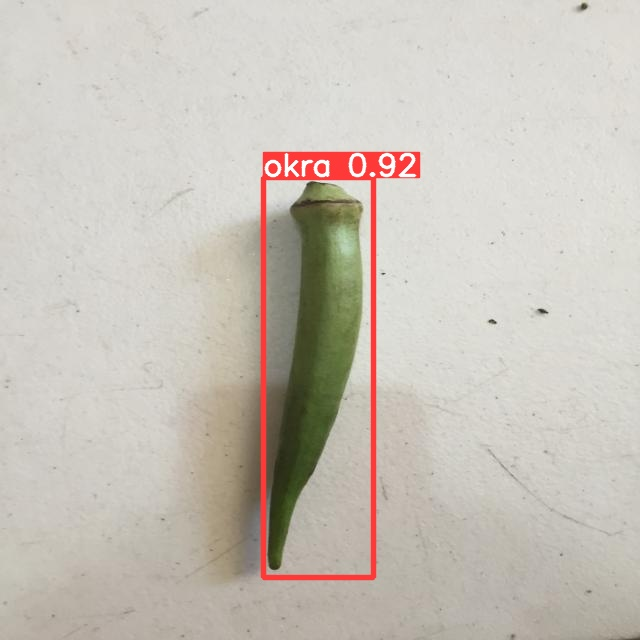

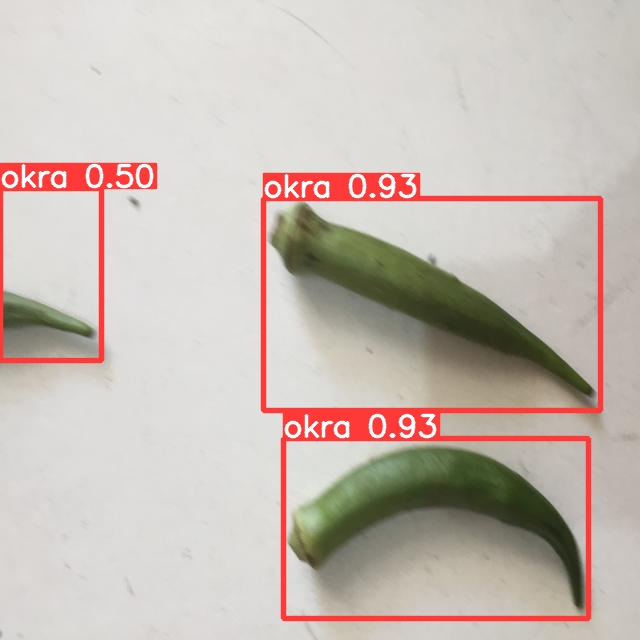

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>